## CS4243 Lab 4: Optical Flow and Textons

**ASSIGNMENT SUBMISSION DEADLINE: Apr 26, 22h00**

**Instructions:**
- See `lab4.pdf` and `lab4.py` for detailed descriptions.

- The functions to be implemented are given in `lab4.py`, with a description of each function. You will need to fill in the code where it is marked with the following:
    ```
    # Your code starts here #

    # Your code ends here #
    ```
    
- For open questions, write your answers directly into the notebook. 

- You are free to use NumPy, OpenCV, scipy and skimage functions.

**Attention:**
- Please use python with version >= 3.8.4, and install the libs provided in requirements.txt via `conda install -c conda-forge ffmpeg ` and `pip install -r requirements.txt`.
- Please do not change the structure of files in the whole folder of this assignment, otherwise TA may mark your code wrongly.
- Please do not change the inputs arguments of the functions in `lab4.py`, otherwise your implementation would fail to pass the test.
- The functions in `utils.py` are to help us and should not have to be changed. Nonetheless, feel free to make adjustments if there are issues on your end.
- As long as your output is close to the expected answer, you will get full credit.

**Submission instructions:**

Upload to Canvas your completed lab4.py and lab4.ipynb by zipping them into a file named AXXX1_AXXX2.zip, where AXXX is the student number of the group members.  Submit one file per group.  Missing files, incorrectly formatted code that does not run, etc. will be penalized. 

If you have any question regarding this lab, do not hesistate to ask questions under the Labs section on Canvas Discussions. You can also attend any lab slot for FAQs.



To begin, load the following packages:


In [150]:
%load_ext autoreload
%autoreload 2

from lab4 import *
from utils import *
from tqdm import tqdm
from IPython.display import HTML

import os
os.environ["OMP_NUM_THREADS"] = "4" # export OMP_NUM_THREADS=4

import warnings
warnings.filterwarnings("ignore")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Part 1: Horn-Schonck Optical Flow

Run following code cell to load the video.

In [151]:
# load frames
path = "blackswan"

frames = load_frames_rgb(path)
testing_seq = frames[:10]
# video visualization
ani = animated_frames(frames)
display(HTML(ani.to_html5_video()))
plt.close()

In order to predict the segmentation of moving objects and background in the entire video. The very naive idea is to predict the segmentation by K-mean on pixel RGB features. The following code cell does this on the fisrt frame. 


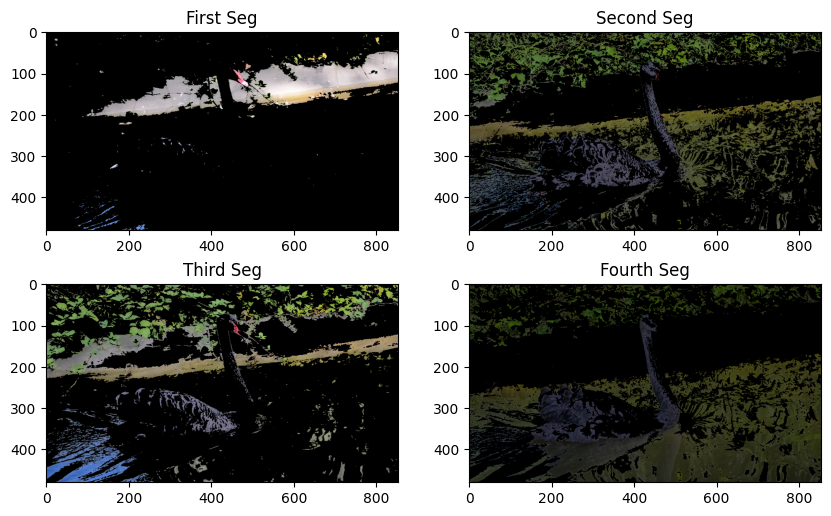

In [152]:
results = []
K=4

img = testing_seq[0]
label = kmeans(K, img)
out = color.label2rgb(label, img, bg_label=0)
segs = []
for i in range(K):
    seg = img.copy()
    seg[label!=i]=0
    segs.append(seg)


fig, axs = plt.subplots(2, 2, figsize=(10, 6))

axs[0, 0].imshow(segs[0])
axs[0, 0].set_title('First Seg')
axs[0, 1].imshow(segs[1])
axs[0, 1].set_title('Second Seg')
axs[1, 0].imshow(segs[2])
axs[1, 0].set_title('Third Seg')
axs[1, 1].imshow(segs[3])
axs[1 ,1].set_title('Fourth Seg')

plt.show()

To obtain the segmentation of the complete testing sequence, run the following cell:

In [153]:
results = []
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on RGB values'):
    label = kmeans(4, img)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB values: 10it [00:00, 14.96it/s]


### TASK 1.1 (40%)

Using only RGB values for segmentation cannot achieve the desired results. 
It can be observed that the movement of the swan is distinguishable from the background, so we use motion or displacement as features for segmentation.

**TASK 1.1: Complete `calcOpticalFlowHS()` in `lab4.py`. Run following code and tweak suitable smoothing parameter `lambda` and threshold `delta`.**

In [154]:
%%time
flows = []
vis = []

for i in tqdm(range(len(testing_seq)-1), desc='compute optical flow'):
    prvs = testing_seq[i]
    hsv = np.zeros_like(prvs)
    prvs = cv2.cvtColor(prvs, cv2.COLOR_BGR2GRAY)
    next = testing_seq[i+1]
    next = cv2.cvtColor(next, cv2.COLOR_BGR2GRAY)
    hsv[..., 1] = 255
    flow = calcOpticalFlowHS(prvs, next, param_lambda = 1, param_delta = 1.5e-4)
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang*180/np.pi/2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    
    flows.append(flow) 
    vis.append(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB))

ani = animated_frames(vis)
display(HTML(ani.to_html5_video()))
plt.close()

compute optical flow:   0%|          | 0/9 [00:00<?, ?it/s]

0.0763469556306223
0.059568407389505876
0.04969030623029061
0.04311710993425194
0.03804870688433265
0.03408805987414765
0.030860290352675568
0.02817825884274322
0.025905551065997956
0.02378428905839297
0.022149285177480493
0.02068614193885865
0.01936926416677409
0.018177986579343774
0.01710930052536519
0.01614058479567826
0.015252448218911252
0.014435408011376216
0.01368147242036033
0.012983844335321737
0.012336695330005254
0.011734991260895389
0.011191137248949046
0.010783402684072463
0.010399644875820069
0.0100380103237937
0.00974903997579385
0.00947842726637016
0.009218168847323127
0.008967974139590162
0.008727517563722753
0.008496452143242517
0.008274419591849935
0.00806105775202598
0.007867961825563596
0.007687140373639878
0.007512599644016682
0.007344108740160893
0.007181438967967579
0.007024365537547261
0.006932270560620513
0.006856628010857568
0.006780997470868078
0.006705481102428579
0.006630169909470962
0.00655514489201281
0.006480478068176643
0.00640623338152263
0.0063324675

compute optical flow:  11%|█         | 1/9 [01:28<11:46, 88.29s/it]

0.0001503299059902874
0.00015025134773272164
0.00015017282666585086
0.0001500943427825696
0.00015001589607521737
0.00014993748653657768
[[[-0.35765482  0.50196668]
  [-0.36133618  0.50236019]
  [-0.36049259  0.49805547]
  ...
  [-0.76362297  0.07148967]
  [-0.76431546  0.07798112]
  [-0.76454833  0.08139906]]

 [[-0.35030254  0.48960783]
  [-0.35244769  0.49208404]
  [-0.35512887  0.4939941 ]
  ...
  [-0.76202381  0.07734042]
  [-0.76374641  0.08230191]
  [-0.7646389   0.08497714]]

 [[-0.34158549  0.47692648]
  [-0.34037067  0.47684528]
  [-0.34116029  0.48086949]
  ...
  [-0.761846    0.08877881]
  [-0.76466049  0.09158789]
  [-0.76598239  0.09309909]]

 ...

 [[ 0.01094117  0.0801706 ]
  [ 0.01237301  0.08225283]
  [ 0.01448029  0.08595198]
  ...
  [-0.16504049  0.05330575]
  [-0.14103189  0.06304484]
  [-0.13944344  0.06725771]]

 [[ 0.01606723  0.08458314]
  [ 0.01762069  0.08617597]
  [ 0.01862875  0.08850879]
  ...
  [-0.14216591  0.05227787]
  [-0.1196817   0.0605614 ]
  [-0.11

compute optical flow:  22%|██▏       | 2/9 [02:34<08:48, 75.47s/it]

0.00014995285640762024
[[[-0.24791509  0.29501041]
  [-0.24675376  0.28323613]
  [-0.2442944   0.2634358 ]
  ...
  [-1.61305366  0.17994174]
  [-1.60396123  0.17938928]
  [-1.5988299   0.18027832]]

 [[-0.24495612  0.30098447]
  [-0.24555795  0.28823981]
  [-0.24298292  0.26392241]
  ...
  [-1.60515775  0.18765998]
  [-1.59793411  0.18704988]
  [-1.59502544  0.1873456 ]]

 [[-0.23367263  0.29253025]
  [-0.23855557  0.28607556]
  [-0.24096169  0.26383321]
  ...
  [-1.59688087  0.22072527]
  [-1.59192309  0.21346064]
  [-1.590913    0.20967077]]

 ...

 [[ 0.18595608  0.47154789]
  [ 0.18564191  0.47042537]
  [ 0.1866962   0.46886046]
  ...
  [-0.90175442  0.6863833 ]
  [-0.90939767  0.6888123 ]
  [-0.91052757  0.69007529]]

 [[ 0.18712136  0.46968968]
  [ 0.18773544  0.46995861]
  [ 0.19005045  0.46974024]
  ...
  [-0.90144839  0.68554313]
  [-0.90856672  0.68799514]
  [-0.91003249  0.68925309]]

 [[ 0.18839283  0.46939017]
  [ 0.18956624  0.46970078]
  [ 0.19240902  0.4697303 ]
  ...
 

compute optical flow:  33%|███▎      | 3/9 [03:29<06:35, 65.90s/it]

0.0821595245304546
0.0602691700369855
0.05237877748466116
0.0432802369667494
0.03798422150430736
0.034131340001799626
0.03143485060685852
0.029060613744431363
0.02695804861245038
0.02508611705865821
0.02341030316371373
0.02190251501882562
0.020539601795147633
0.019302454632040555
0.018186022885466446
0.017194735469696854
0.016281480775240276
0.015438037783561731
0.014657258174089971
0.013932904005350855
0.013259511663819445
0.012632278256430873
0.01204696677936945
0.011499826787490175
0.01098752781618717
0.0105071032901638
0.010055903075346428
0.00975376025189556
0.00958953669351853
0.009427113580537327
0.009266688867445694
0.00910842133651063
0.008952436506754757
0.008798831686390174
0.008647680288993431
0.0084990355185251
0.008352933514330418
0.008209396034663141
0.008068432746173082
0.007930043177079404
0.007794218383340934
0.007660942369886792
0.007530193302768995
0.007401944542780481
0.007276165526569733
0.007152822517419999
0.007031879244594752
0.006913297447360023
0.006797037337

compute optical flow:  44%|████▍     | 4/9 [04:09<04:39, 55.85s/it]

0.00015055038782835206
0.0001504462295663922
0.00015034212485709464
0.00015023807372982478
0.00015013407621405905
0.00015003013233877427
0.00014992624213311379
[[[-0.53445283  0.27739985]
  [-0.53229941  0.28216697]
  [-0.52814322  0.28935715]
  ...
  [-1.39914942  0.62100058]
  [-1.4025112   0.62309033]
  [-1.40770351  0.62236438]]

 [[-0.53449303  0.28071768]
  [-0.5326739   0.28396513]
  [-0.52914357  0.28967979]
  ...
  [-1.40469033  0.61548796]
  [-1.406816    0.61522177]
  [-1.41039673  0.61343466]]

 [[-0.53598593  0.28938314]
  [-0.53471323  0.29131902]
  [-0.53239844  0.29522906]
  ...
  [-1.41364161  0.60363109]
  [-1.41153224  0.59983506]
  [-1.41201145  0.59648201]]

 ...

 [[ 0.85963526  1.36843694]
  [ 0.86002595  1.37068444]
  [ 0.8623221   1.37742133]
  ...
  [-0.9640443  -0.49928354]
  [-0.96068201 -0.4983176 ]
  [-0.95957819 -0.49819144]]

 [[ 0.87450459  1.38731837]
  [ 0.87662967  1.39054346]
  [ 0.87971284  1.39820937]
  ...
  [-0.96661132 -0.4996551 ]
  [-0.963314

compute optical flow:  56%|█████▌    | 5/9 [04:47<03:16, 49.17s/it]

0.07723771093795763
0.06179972695034161
0.050846297366270166
0.04393989857046751
0.03849875644049669
0.03425014275569399
0.03104494663855284
0.02866485686849707
0.026557339667828972
0.02468170203818565
0.02300365264561649
0.021495095797945507
0.02017285245275191
0.018979766951053634
0.017892000727836144
0.016894302194066124
0.0159767882780657
0.015130892849594568
0.014349172210123051
0.013780601559118533
0.013289497888732849
0.012815747449548387
0.01235943075572593
0.011920423490226928
0.011498453989536528
0.011093145859006004
0.010704049756007972
0.010330667202006538
0.009972468475376695
0.009628906072784327
0.00929942482904167
0.008983469501473218
0.008801795705571491
0.008727565506556956
0.008652871380200267
0.008577808583702717
0.008508247738662544
0.008459421360009878
0.008407963970088583
0.008354176908958066
0.008298331728316455
0.008246897811027665
0.008196019601329041
0.008143048916960438
0.00808822867168052
0.008031778756059316
0.007973898357253706
0.007914768029282482
0.00785

compute optical flow:  67%|██████▋   | 6/9 [05:33<02:24, 48.20s/it]

0.00015004410186891803
0.00014977904300716993
[[[-0.31989179  0.21279806]
  [-0.32234057  0.20530832]
  [-0.32733903  0.19748761]
  ...
  [-1.18808165  0.25274075]
  [-1.18373624  0.24922867]
  [-1.18193047  0.2473402 ]]

 [[-0.32676875  0.20854925]
  [-0.32854268  0.20280695]
  [-0.33056528  0.19675935]
  ...
  [-1.18753339  0.25113516]
  [-1.18344291  0.24762234]
  [-1.18143863  0.24569606]]

 [[-0.33501087  0.2022097 ]
  [-0.33576681  0.2003509 ]
  [-0.33607024  0.19588122]
  ...
  [-1.18603534  0.24793234]
  [-1.1820163   0.24445204]
  [-1.17991195  0.24248308]]

 ...

 [[ 0.63529635  1.09296998]
  [ 0.63613575  1.0934509 ]
  [ 0.63762293  1.09438821]
  ...
  [-0.60890377 -0.10136945]
  [-0.60833516 -0.09956144]
  [-0.60782303 -0.09890289]]

 [[ 0.63713594  1.09351889]
  [ 0.63798747  1.09400972]
  [ 0.63952279  1.09499241]
  ...
  [-0.61033122 -0.09820852]
  [-0.6102291  -0.0966778 ]
  [-0.60970851 -0.09616351]]

 [[ 0.63809699  1.09372446]
  [ 0.6389593   1.09423401]
  [ 0.640508

compute optical flow:  78%|███████▊  | 7/9 [06:28<01:40, 50.34s/it]

0.00015108099128946506
0.00015085626161748245
0.00015063186713693
0.00015040780738706516
0.00015018408190914379
0.0001499606902428674
[[[-0.45291336  0.16987815]
  [-0.44966327  0.17419628]
  [-0.44867697  0.17627295]
  ...
  [-1.11978638  0.22462298]
  [-1.11901126  0.22229073]
  [-1.11871775  0.22094924]]

 [[-0.45044573  0.17249937]
  [-0.44928946  0.17600908]
  [-0.45018739  0.17740206]
  ...
  [-1.12020735  0.2238159 ]
  [-1.11923512  0.22146346]
  [-1.11884363  0.21992467]]

 [[-0.44759268  0.17781492]
  [-0.44801521  0.17871572]
  [-0.45105736  0.17900452]
  ...
  [-1.12013018  0.22240787]
  [-1.11907927  0.22038836]
  [-1.1184909   0.2190039 ]]

 ...

 [[ 0.63510154  1.24207779]
  [ 0.63594878  1.24282852]
  [ 0.63769475  1.24441618]
  ...
  [-0.67867781 -0.03538247]
  [-0.67585595 -0.03631284]
  [-0.67485735 -0.03628545]]

 [[ 0.63681387  1.24293131]
  [ 0.63773814  1.24375885]
  [ 0.63965286  1.24549426]
  ...
  [-0.67806202 -0.03678773]
  [-0.67488258 -0.03780508]
  [-0.6740

compute optical flow:  89%|████████▉ | 8/9 [07:15<00:49, 49.52s/it]

0.00015019204526833807
0.0001501068595035071
0.00015002171101274886
0.00014993659981099583
[[[-0.2480236   0.10153967]
  [-0.24989341  0.10203002]
  [-0.24978632  0.1043423 ]
  ...
  [-0.96452475  0.20594899]
  [-0.96890276  0.19934063]
  [-0.96942736  0.19506796]]

 [[-0.25002111  0.099182  ]
  [-0.25106205  0.10095233]
  [-0.25247142  0.10192834]
  ...
  [-0.96399753  0.20596714]
  [-0.96813726  0.19957699]
  [-0.9681663   0.19536525]]

 [[-0.25029171  0.09764365]
  [-0.25272608  0.09876486]
  [-0.25691271  0.09823819]
  ...
  [-0.96082075  0.20770639]
  [-0.96416797  0.2033937 ]
  [-0.96401873  0.20090906]]

 ...

 [[ 0.53284461  1.08322782]
  [ 0.53308484  1.08319017]
  [ 0.53348475  1.08310383]
  ...
  [-0.3580996   0.109929  ]
  [-0.35743556  0.1101111 ]
  [-0.35682852  0.10995905]]

 [[ 0.53320434  1.08251452]
  [ 0.53344816  1.08246391]
  [ 0.53383131  1.08236072]
  ...
  [-0.3597216   0.11192925]
  [-0.35991023  0.11204282]
  [-0.35938155  0.11176464]]

 [[ 0.53340304  1.08212

compute optical flow: 100%|██████████| 9/9 [08:15<00:00, 55.10s/it]


CPU times: total: 6min 54s
Wall time: 8min 16s


Run K-means on HornSchunck optical flow for the first frame. 
You will see the main object is well segmented. However, the background is noisy. 

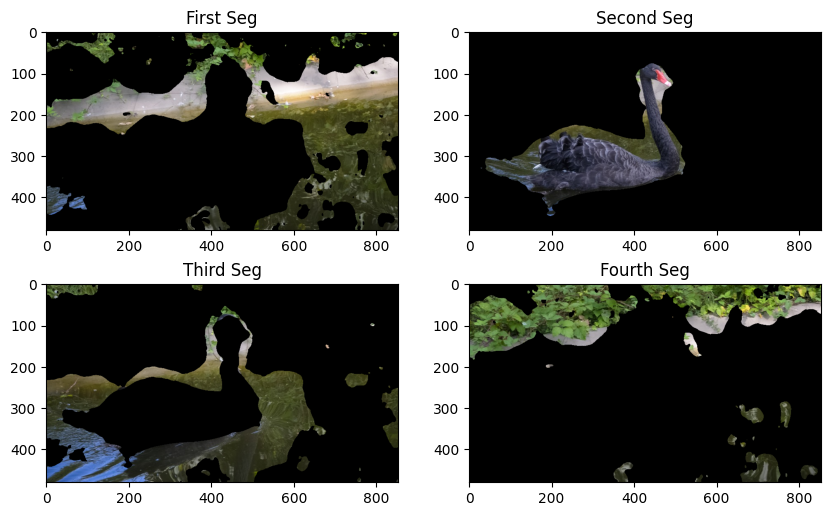

CPU times: total: 2.03 s
Wall time: 837 ms


In [155]:
%%time
results = []
K=4

img = testing_seq[0]
label = kmeans(K, flows[0])
out = color.label2rgb(label, img, bg_label=0)
segs = []
for i in range(K):
    seg = img.copy()
    seg[label!=i]=0
    segs.append(seg)

fig, axs = plt.subplots(2, 2, figsize=(10, 6))

axs[0, 0].imshow(segs[0])
axs[0, 0].set_title('First Seg')
axs[0, 1].imshow(segs[1])
axs[0, 1].set_title('Second Seg')
axs[1, 0].imshow(segs[2])
axs[1, 0].set_title('Third Seg')
axs[1, 1].imshow(segs[3])
axs[1 ,1].set_title('Fourth Seg')

plt.show()

Run the following cell to get the segmentation of the complete testing sequence.

In [156]:
results = []
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on flow feature'):
    label = kmeans(4, flow)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()


k-mean segmentation on flow feature: 9it [00:00, 19.95it/s]


### TASK 1.2 (5%)

We then combine the appearance and motion evidence: concatenate the RGB values and optical flow to form the aggregated feature, and consider reweighting features for better results. 

**TASK 1.2: Use `combine_and_normalize_features()` in `lab4.py`. Run following code and tweak suitable weighting parameter `gamma`.**

In [157]:
results = []
gamma = 3
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on RGB feature'):
    feats = combine_and_normalize_features(feat1=testing_seq[i], feat2=flow, gamma=gamma)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB feature: 9it [00:00, 12.94it/s]


### TASK 1.3 (5%)

- **How do the parameters `lambda` and `delta` affect the optical flow results?**

Increasing lambda causes the result to be smoother (between adjacent pixel the color gradation visually, and the flow direction numerically). Increasing delta causes less iteration, and therefore the result would be less accurate.

- **How does the weighting parameter `gamma` affect the final segmentation results?**

Small gamma causes the segmentation to be more sensitive, caputring more details but also capturing more noise


After adding appearance information, the white wall was effectively segmented, but the complex leaves were not. In the next section, we will use textons as features for segmentation.

## Section 2: Textons

The image is convolved with a 17-dimensional filter-bank at scale κ. The filter-bank consists of Gaussians at scales κ, 2κ and 4κ, x and y derivatives of Gaussians at scales 2κ and 4κ, and Laplacians of Gaussians at scales κ, 2κ, 4κ and 8κ.
Run following code to visualize them.


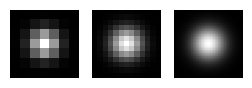

In [158]:
# Gaussians at scales κ, 2κ and 4κ

kappa = 1
kernels = {}

kernels['gaussian']=[]
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(3,1))  

for i, sigma in enumerate([kappa, 2*kappa, 4*kappa]):
    kg = build_gaussian_kernel(sigma=sigma)
    kernels['gaussian'].append(kg)
    ax[i].imshow(kg, cmap = 'gray')
    ax[i].axis("off")
    
plt.show()


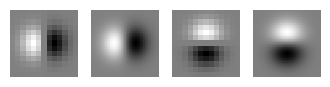

In [159]:
# x and y derivatives of Gaussians at scales 2κ and 4κ

kernels['gaussian_derivative']=[]
ydg2, xdg2 = build_gaussian_derivative_kernel(sigma=2*kappa)
ydg4, xdg4 = build_gaussian_derivative_kernel(sigma=4*kappa)

fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(4,1))  
ax[0].imshow(xdg2, cmap = 'gray')
ax[0].axis("off")
ax[1].imshow(xdg4, cmap = 'gray')
ax[1].axis("off")
ax[2].imshow(ydg2, cmap = 'gray')
ax[2].axis("off")
ax[3].imshow(ydg4, cmap = 'gray')
ax[3].axis("off")
plt.show()

kernels['gaussian_derivative'] = [ydg2, ydg4, xdg2, xdg4]

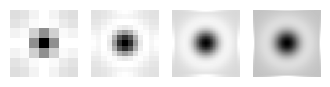

In [160]:
# Laplace of Gaussians at scales κ, 2κ and 4κ, 8k

kernels['LoG']=[]
fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(4,1))  
for i, sigma in enumerate([kappa, 2*kappa, 4*kappa, 8*kappa]):
    klg = build_LoG_kernel(sigma=sigma)
    ax[i].imshow(klg, cmap = 'gray')
    ax[i].axis("off")
    kernels['LoG'].append(klg)

plt.show()


After buiding the filter bank, run following code to load training image,  The Microsoft Research Cambridge (MSRC) database2 is composed of 591 photographs of the following 21 object classes: building, grass, tree, cow, sheep, sky, airplane, water, face, car, bicycle, flower, sign, bird, book, chair, road, cat, dog, body, and boat. Examples are shown below:

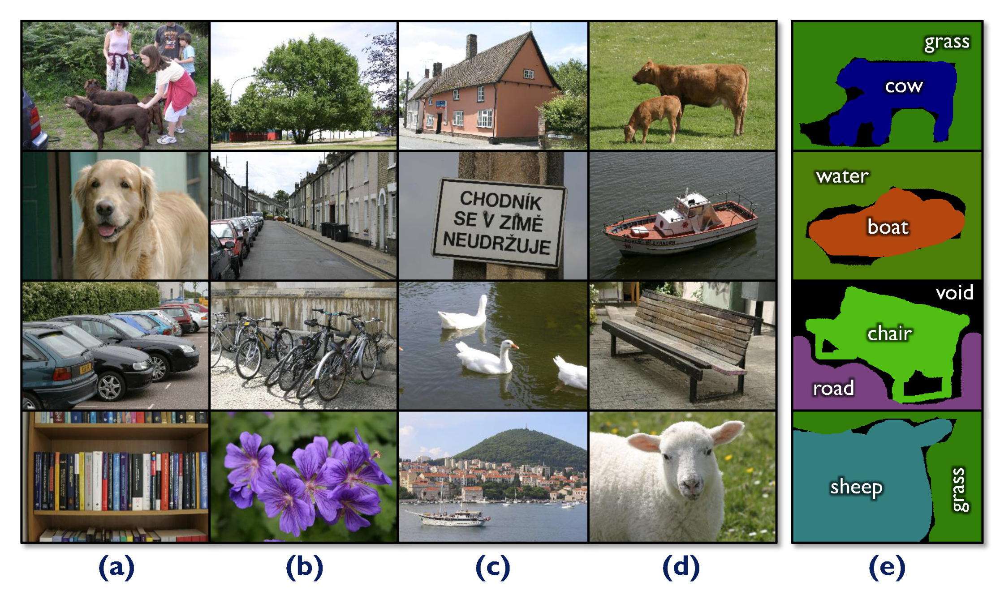

In [161]:
with open('Train.txt') as f:
    frames = f.read().splitlines()
training_imgs = [cv2.cvtColor(cv2.imread(os.path.join('MSRC_v2', frame)), cv2.COLOR_BGR2RGB) for frame in frames]
print(len(training_imgs))

276


**Understand `features_from_filter_bank()` in `lab4.py`.**

Run following code to visualize the filter response for the first training image.


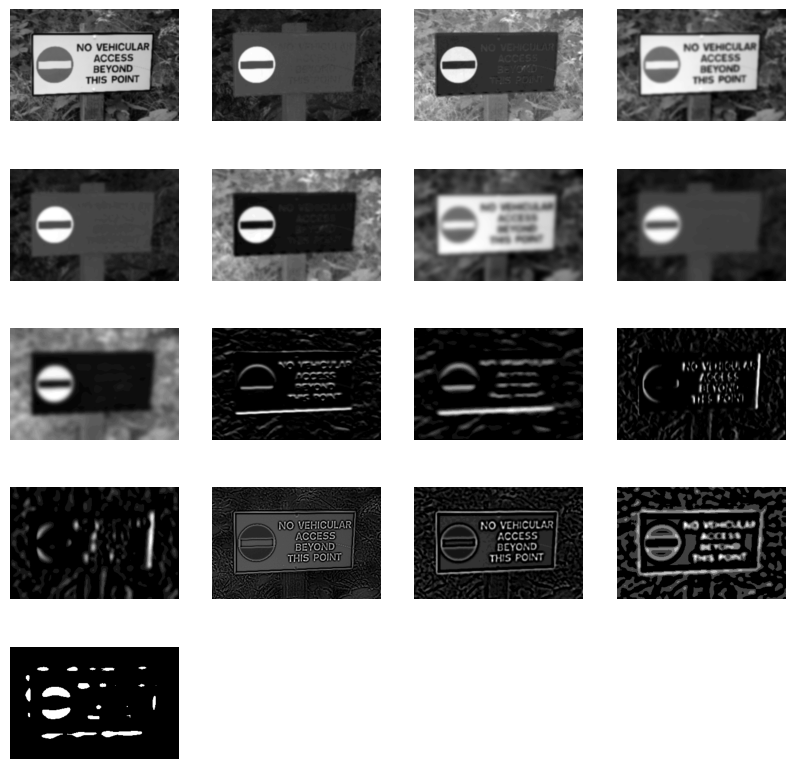

CPU times: total: 547 ms
Wall time: 760 ms


In [162]:
%%time

fig, ax = plt.subplots(ncols=4, nrows=5, figsize=(10,10))

c = features_from_filter_bank(training_imgs[0], kernels)

for i in range(20): 
    if i<17:
        ax[i//4, i%4].imshow(c[:,:,i], cmap = 'gray')
    ax[i//4, i%4].axis("off")
plt.show()

### TASK 2.1 (30%)

Next, you will learn the textons by clustering the training data (The Microsoft Research Cambridge (MSRC) database2) using the K-mean algorithm. 

**TASK 2.1: Implement `Textonization()` class in `lab4.py`.**

In [163]:
%%time
results = []

textonization = Textonization(kernels, n_clusters=200)
textonization.training(training_imgs)
gamma = 5
textures = []
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on textons'):
    feats = textonization.testing(img)
    textures.append(feats)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on textons: 10it [04:16, 25.64s/it]


CPU times: total: 7min 25s
Wall time: 6min 45s


**Understand `histogram_per_pixel()` in `lab4.py`.**

In [164]:

%%time
results = []
histogram_feat=[]
gamma = 5
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on textons'):
    texture = textures[i]
    feats = histogram_per_pixel(texture, window_size=49)
    histogram_feat.append(feats)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()




k-mean segmentation on textons: 10it [02:12, 13.22s/it]


CPU times: total: 1min 46s
Wall time: 2min 13s


### TASK 2.2 (15%)

- **How does the window size of the texton histogram impact the final results?** 

- **Compared to segmentation based only on texton ID, what are the advantages and disadvantages? Please explain your reasoning. Hint: analyze the boundary.**


## Section 3: Segmentations with Optical Flow and Textons

In the final step, you need to combine the optical flow feature from Part 1 with the texture features obtained from Part 2.

**TASK 3.1: Adjust `gamma` for better results.**

In [165]:
results = []
gamma = 3
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on RGB feature'):
    feats = combine_and_normalize_features(feat1=histogram_feat[i], feat2=flow, gamma=gamma)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB feature: 9it [00:26,  2.91s/it]
